In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import re
sns.set_style("darkgrid")
pd.set_option('display.max_columns', None)

import matplotlib
print('matplotlib version: {}'.format(matplotlib.__version__))

import seaborn
print('seaborn version: {}'.format(seaborn.__version__))


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (6, 3)
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

matplotlib version: 3.10.1
seaborn version: 0.13.2


In [3]:
path = 'nansiz.csv'
#ri = pd.read_csv(path)  #,encoding='latin-1')
ri1=pd.read_csv(path)

In [7]:
ri1[['mileage']].sort_values('mileage').reset_index(drop=True)

,mileage
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
5,0.0
6,0.0
7,0.0
8,0.0
9,0.0


In [9]:
ri1.loc[ri1['mileage'] < 100, ['make_model', 'age','mileage', 'seller']]


,make_model,age,mileage,seller
35,Dacia Dokker,0.0,90.0,Dealer
73,Dacia Duster,0.0,400.0,Dealer
88,Dacia Duster,0.0,400.0,Dealer
93,Dacia Duster,5.0,10.0,Dealer
97,Dacia Duster,5.0,10.0,Dealer
100,Dacia Duster,1.0,1.0,Dealer
105,Dacia Duster,5.0,10.0,Dealer
106,Dacia Duster,5.0,10.0,Dealer
114,Dacia Duster,0.0,10.0,Dealer
121,Dacia Duster,1.0,10.0,Dealer


In [13]:
result = ri1.loc[
    (ri1['age'] > 1) & (ri1['mileage'] < 500),
    ['make_model', 'age','mileage', 'seller']
]

# Sonucu görüntülemek için:
print(result)

              make_model    age  mileage          seller
93          Dacia Duster    5.0     10.0          Dealer
97          Dacia Duster    5.0     10.0          Dealer
105         Dacia Duster    5.0     10.0          Dealer
106         Dacia Duster    5.0     10.0          Dealer
125         Dacia Duster    5.0     10.0          Dealer
234         Dacia Duster    5.0     10.0          Dealer
1541       Fiat 124 Coup   50.0     55.0  Private seller
1658            Fiat 131   43.0    300.0          Dealer
1659            Fiat 131   34.0      1.0          Dealer
1661            Fiat 131   46.0    200.0  Private seller
1764            Fiat 500   59.0     10.0          Dealer
1800            Fiat 500    2.0      5.0          Dealer
2285           Fiat 500C    2.0     15.0          Dealer
2916            Fiat 850   55.0     20.0          Dealer
2971          Fiat Coupe   25.0      1.0          Dealer
3134           Fiat Dino   47.0      1.0          Dealer
3762           Fiat Tipo    3.0

In [14]:
ri1 = ri1.loc[~((ri1['age'] > 1) & (ri1['mileage'] < 500))].reset_index(drop=True)


In [15]:
ri1 = ri1[
    (ri1['price']        >= 1000)    & (ri1['price']        <= 200000) &
    (ri1['mileage']      >= 101)     & (ri1['mileage']     <= 300000) &
    (ri1['power']        >= 50)      & (ri1['power']       <= 600) &
    (ri1['engine_size']  >= 250)     & (ri1['engine_size'] <= 7000) &
    (ri1['CO2_emissions'] <= 300)    &
    (ri1['empty_weight'] >= 900)     & (ri1['empty_weight'] <= 3000) &
    (ri1['age']          >= 0)       & (ri1['age']         <= 30) &
    (ri1['cons_avg']     >= 1)       & (ri1['cons_avg']    <= 15)
].copy()

In [20]:
ri1.describe()



,price,mileage,power,engine_size,CO2_emissions,empty_weight,previous_owner,age,cons_avg,comfort_convenience_count_z,entertainment_media_count_z,safety_security_count_z,extras_count_z
count,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000,24742.000000
mean,22046.119069,75570.991512,162.375616,1752.849951,130.812384,1422.125859,0.705723,6.135094,6.234441,0.038813,0.010829,0.036074,0.027894
std,17857.929488,60159.414555,85.928034,699.267073,54.832866,254.818814,0.925117,5.638611,2.142846,0.990515,0.983216,0.974206,1.008805
min,1000.000000,105.000000,54.000000,332.000000,0.000000,900.000000,0.000000,0.000000,1.000000,-1.441825,-1.285381,-1.591889,-1.044769
25%,11900.000000,26830.000000,110.000000,1364.000000,104.000000,1273.000000,0.000000,2.000000,4.900000,-0.811841,-0.760975,-0.597900,-0.784028
50%,17000.000000,62470.500000,136.000000,1598.000000,124.000000,1395.000000,0.000000,4.000000,5.650000,-0.055860,0.025634,0.023344,-0.262545
75%,26999.000000,109756.750000,190.000000,1984.000000,156.000000,1536.000000,1.000000,8.000000,7.000000,0.826117,0.812243,0.768836,0.519680
max,200000.000000,300000.000000,600.000000,6208.000000,300.000000,2900.000000,14.000000,30.000000,15.000000,2.842066,2.909867,2.881063,5.734510


In [21]:
ri1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24742 entries, 0 to 28411
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   24742 non-null  object 
 1   make                         24742 non-null  object 
 2   model                        24742 non-null  object 
 3   location                     24742 non-null  object 
 4   price                        24742 non-null  float64
 5   body_type                    24742 non-null  object 
 6   type                         24742 non-null  object 
 7   mileage                      24742 non-null  float64
 8   gearbox                      24742 non-null  object 
 9   paint                        24742 non-null  object 
 10  seller                       24742 non-null  object 
 11  power                        24742 non-null  float64
 12  engine_size                  24742 non-null  float64
 13  CO2_emissions        

In [22]:
ri1[['make_model', 'model']


,make_model,model
0,Dacia Break,Break
1,Dacia Dokker,Dokker
2,Dacia Dokker,Dokker
3,Dacia Dokker,Dokker
4,Dacia Dokker,Dokker
5,Dacia Dokker,Dokker
6,Dacia Dokker,Dokker
7,Dacia Dokker,Dokker
8,Dacia Dokker,Dokker
9,Dacia Dokker,Dokker


In [25]:
# “model” değerinin “make_model” içinde geçip geçmediğini kontrol edip,
# geçmeyen satırları getiren kod:

mask = ~ri1.apply(
    lambda row: isinstance(row['model'], str) and isinstance(row['make_model'], str) 
                and row['model'] in row['make_model'],
    axis=1
)

result = ri1.loc[mask, ['make_model', 'model']]

print(result)

Empty DataFrame
Columns: [make_model, model]
Index: []


In [24]:
# “model” değeri “make_model” içinde geçmiyorsa, “make_model”’e boşlukla “model” ekle
mask = ~ri1.apply(
    lambda row: isinstance(row['model'], str) 
                and isinstance(row['make_model'], str) 
                and row['model'] in row['make_model'],
    axis=1
)

# Mask True olan tüm satırlar için güncelleme
for idx in ri1[mask].index:
    ri1.at[idx, 'make_model'] = f"{ri1.at[idx, 'make_model']} {ri1.at[idx, 'model']}"

📌 Column: make_model
  • Unique count: 482
  • Value counts:
make_model
Renault Megane              813
SEAT Leon                   744
Volvo V40                   740
Volvo C70                   666
Opel Astra                  653
Dacia Sandero               617
Hyundai i30                 600
Peugeot 308                 487
Nissan Qashqai              472
Ford Mustang                472
Ford Focus                  450
SEAT Ibiza                  405
Ford Fiesta                 382
Renault Clio                380
Nissan Micra                358
Volvo XC60                  350
Fiat Tipo                   347
Skoda Octavia               343
Opel Corsa                  327
Fiat 500X                   320
Fiat 500                    303
Volvo V60                   303
Dacia Duster                300
Toyota Yaris                282
Opel Insignia               278
Toyota Auris                229
Skoda Fabia                 227
Peugeot 208                 221
Peugeot RCZ                 218


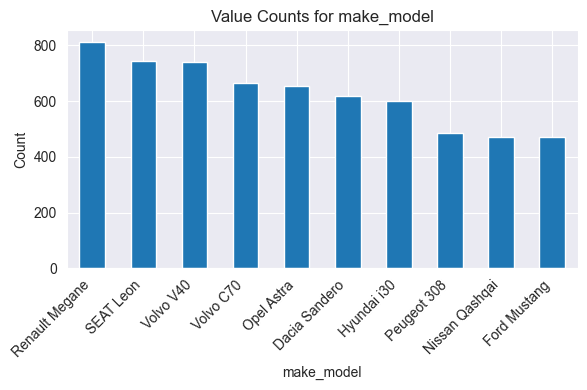


----------------------------------------

📌 Column: make
  • Unique count: 13
  • Value counts:
make
Volvo            3411
Opel             2171
Mercedes-Benz    2141
Peugeot          2077
Renault          1983
Ford             1916
Nissan           1819
Fiat             1777
Toyota           1654
Hyundai          1616
SEAT             1582
Skoda            1351
Dacia            1244


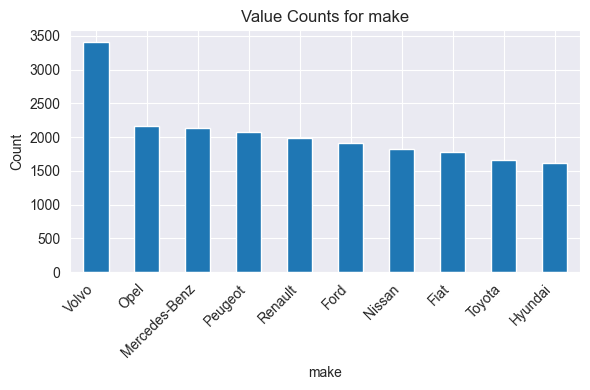


----------------------------------------

📌 Column: model
  • Unique count: 480
  • Value counts:
model
Megane               813
Leon                 744
V40                  740
C70                  666
Astra                653
Sandero              617
i30                  600
308                  487
Qashqai              472
Mustang              472
Focus                450
Ibiza                405
Fiesta               382
Clio                 380
Micra                358
XC60                 350
Tipo                 347
Octavia              343
Corsa                327
500X                 320
500                  303
V60                  303
Duster               300
Yaris                282
Insignia             278
Auris                229
Fabia                227
208                  221
RCZ                  218
C30                  217
Cascada              214
Coupe                210
V90                  206
3008                 199
XC90                 198
XC40                

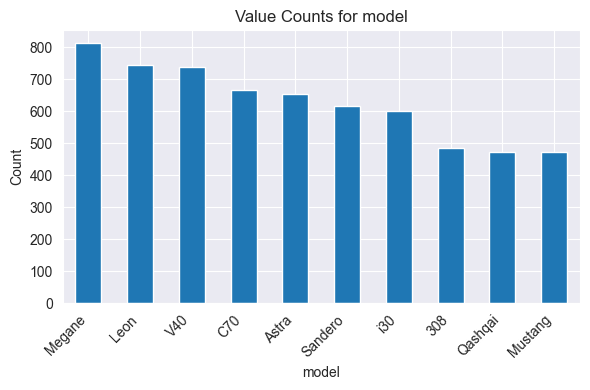


----------------------------------------

📌 Column: location
  • Unique count: 10
  • Value counts:
location
DE    10871
ES     5932
NL     2494
IT     2044
BE     1661
FR     1221
AT      486
LU       31
BG        1
EE        1


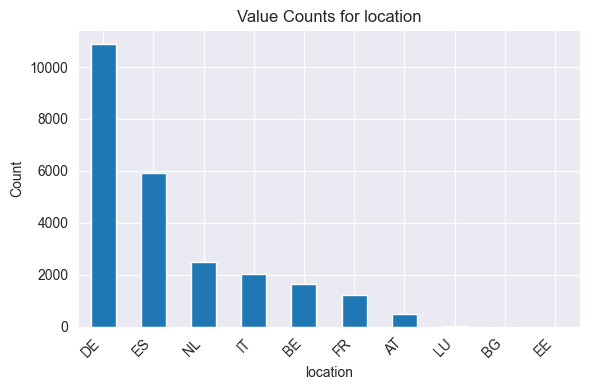


----------------------------------------

📌 Column: price
  • Unique count: 4427
  • Value counts:
price
12990.0     213
14990.0     212
16990.0     150
11990.0     150
9990.0      146
19900.0     138
13990.0     136
19990.0     134
10990.0     130
15900.0     130
14900.0     129
17990.0     122
18990.0     116
13900.0     113
9900.0      113
12900.0     112
15990.0     110
8990.0      109
12490.0     107
11900.0     107
14500.0     103
17900.0     100
16900.0      96
12500.0      94
21990.0      87
13500.0      87
27990.0      86
24990.0      82
18900.0      79
15490.0      78
7990.0       78
29990.0      77
9950.0       74
10900.0      72
23990.0      71
6990.0       71
8500.0       70
8900.0       69
22990.0      68
20990.0      67
24900.0      65
28990.0      64
25990.0      64
11950.0      64
12800.0      63
13950.0      63
22900.0      63
13490.0      63
9500.0       62
8950.0       61
29900.0      60
23900.0      60
11490.0      60
27900.0      58
26990.0      57
16490.0      5

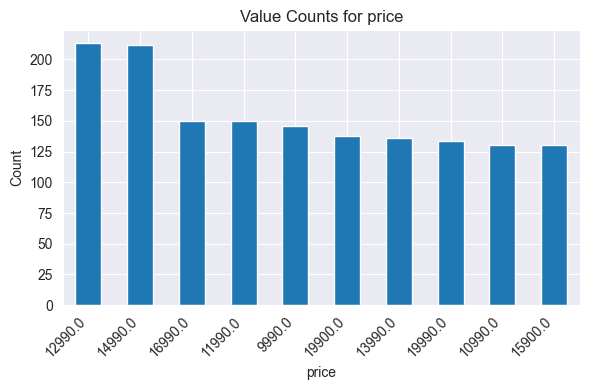


----------------------------------------

📌 Column: body_type
  • Unique count: 6
  • Value counts:
body_type
Station wagon       4989
Off-Road/Pick-up    4688
Compact             4663
Sedan               4320
Coupe               3204
Convertible         2878


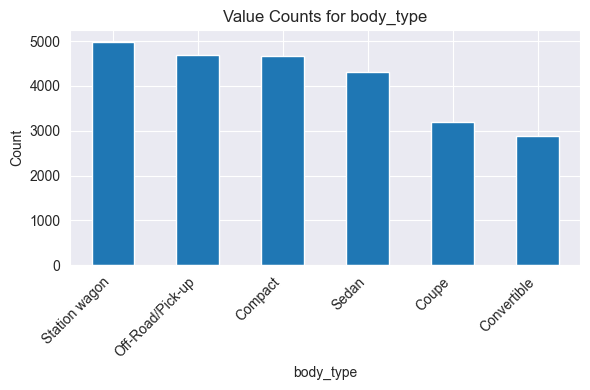


----------------------------------------

📌 Column: type
  • Unique count: 4
  • Value counts:
type
Used              22957
Demonstration      1092
Employee's car      494
Pre-registered      199


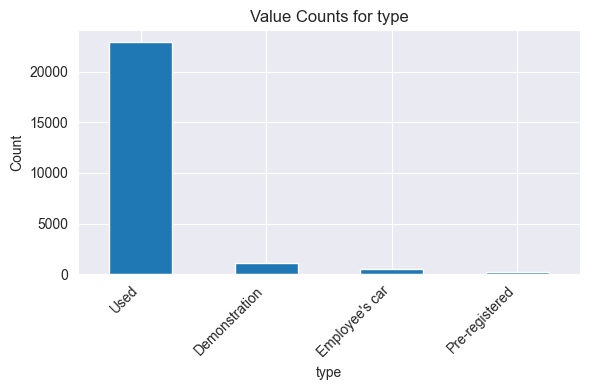


----------------------------------------

📌 Column: mileage
  • Unique count: 13176
  • Value counts:
mileage
5000.0      99
3000.0      71
100000.0    65
90000.0     62
160000.0    60
8000.0      56
140000.0    54
60000.0     53
15000.0     53
10000.0     51
150000.0    51
80000.0     50
6000.0      50
120000.0    48
1500.0      47
85000.0     45
89000.0     45
110000.0    45
170000.0    43
200000.0    43
130000.0    43
70000.0     42
9500.0      41
75000.0     41
65000.0     41
55000.0     40
125000.0    40
1000.0      40
30000.0     38
4500.0      38
180000.0    38
25000.0     37
35000.0     37
2500.0      37
50000.0     37
9900.0      36
20000.0     36
190000.0    36
99000.0     36
7000.0      35
105000.0    35
40000.0     34
145040.0    34
129214.0    34
500.0       33
23000.0     33
45000.0     33
98000.0     33
220000.0    33
95000.0     32
69000.0     32
12000.0     32
27000.0     32
32000.0     32
150.0       32
9000.0      31
78000.0     31
28000.0     31
135000.0    31
1650

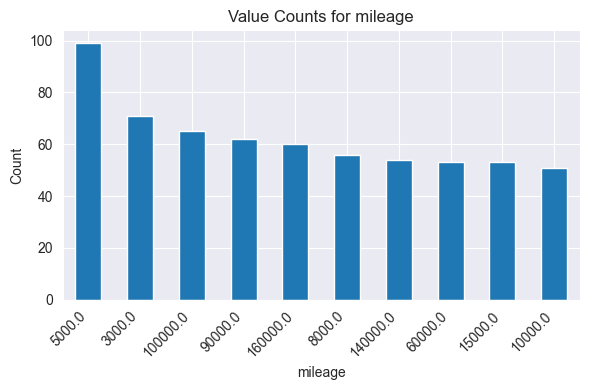


----------------------------------------

📌 Column: gearbox
  • Unique count: 3
  • Value counts:
gearbox
Manual            14972
Automatic          9711
Semi-automatic       59


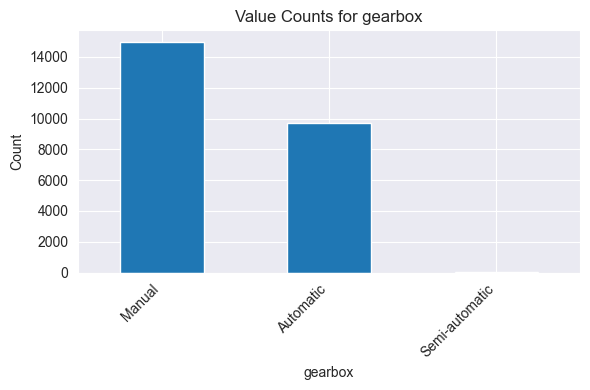


----------------------------------------

📌 Column: paint
  • Unique count: 2
  • Value counts:
paint
Metalic         12544
Non-Metallic    12198


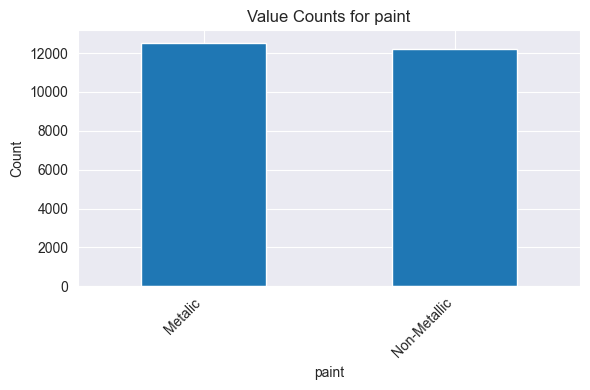


----------------------------------------

📌 Column: seller
  • Unique count: 2
  • Value counts:
seller
Dealer            22835
Private seller     1907


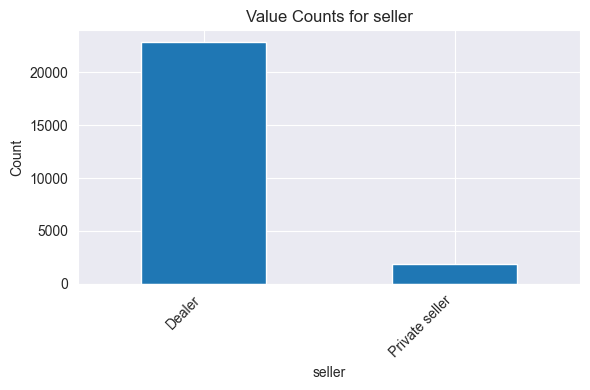


----------------------------------------

📌 Column: power
  • Unique count: 285
  • Value counts:
power
150.0    1757
131.0    1195
120.0    1123
90.0     1080
110.0     977
140.0     958
116.0     943
101.0     771
190.0     758
95.0      645
136.0     632
69.0      532
75.0      481
200.0     421
125.0     420
163.0     398
170.0     397
122.0     318
179.0     317
109.0     303
184.0     272
177.0     236
235.0     235
114.0     233
156.0     229
300.0     219
105.0     212
111.0     196
160.0     193
86.0      187
280.0     186
197.0     185
132.0     176
204.0     173
141.0     161
392.0     155
194.0     137
80.0      137
250.0     131
99.0      125
82.0      123
165.0     122
145.0     120
275.0     120
72.0      115
258.0     115
328.0     113
73.0      113
450.0     112
220.0     109
245.0     108
310.0     106
102.0     104
91.0      103
421.0     102
135.0     102
224.0      99
181.0      98
60.0       95
306.0      93
143.0      91
152.0      91
230.0      90
367.0      84

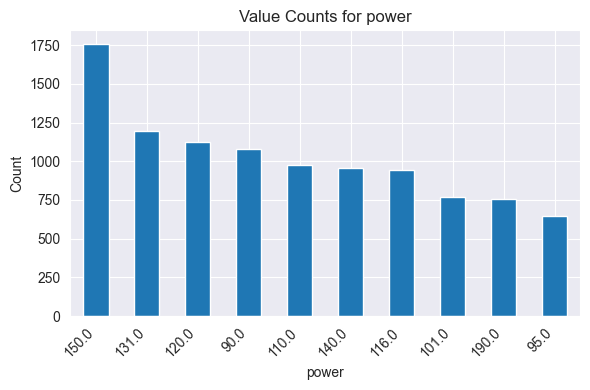


----------------------------------------

📌 Column: engine_size
  • Unique count: 306
  • Value counts:
engine_size
1598.0    2086
1969.0    1944
999.0     1501
1461.0    1118
1998.0     902
1199.0     759
998.0      740
1498.0     667
1997.0     638
1968.0     589
1984.0     549
1798.0     491
1560.0     477
1332.0     412
898.0      402
1197.0     377
1368.0     365
1499.0     356
1991.0     346
1242.0     335
1995.0     335
1248.0     320
2435.0     282
2143.0     249
1364.0     235
1600.0     228
1500.0     207
1591.0     198
1950.0     196
1956.0     193
5038.0     178
3498.0     177
1395.0     173
1796.0     156
1149.0     156
2000.0     154
3696.0     153
1497.0     152
2996.0     147
1198.0     145
1398.0     143
3982.0     142
1200.0     139
1999.0     136
1987.0     133
2400.0     131
1794.0     129
1496.0     126
1582.0     125
1618.0     117
1595.0     116
2925.0     116
1596.0     112
1490.0     107
875.0      107
4951.0     107
2987.0     104
1587.0      99
2261.0      9

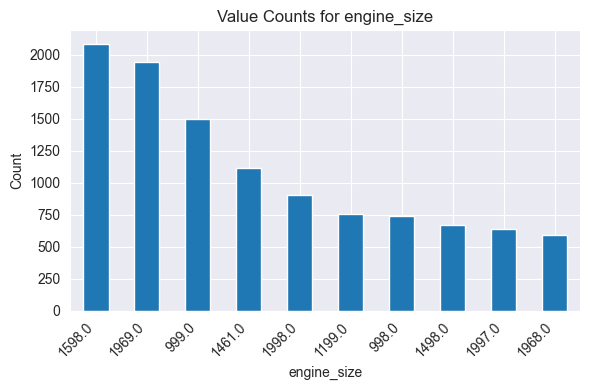


----------------------------------------

📌 Column: CO2_emissions
  • Unique count: 277
  • Value counts:
CO2_emissions
0.0      1165
124.0     786
119.0     724
99.0      691
115.0     533
129.0     484
82.0      449
109.0     396
108.0     369
139.0     368
149.0     364
130.0     354
114.0     337
98.0      332
120.0     310
104.0     309
125.0     299
178.0     293
103.0     280
135.0     277
105.0     269
110.0     268
95.0      257
123.0     243
127.0     242
117.0     237
111.0     224
106.0     223
126.0     223
273.0     217
107.0     217
133.0     214
92.0      206
138.0     203
112.0     203
122.0     196
134.0     187
93.0      185
113.0     185
154.0     184
145.0     184
131.0     183
85.0      181
161.0     180
88.0      179
148.0     179
116.0     178
147.0     177
94.0      172
159.0     169
128.0     168
118.0     167
155.0     163
144.0     162
121.0     156
96.0      155
167.0     155
156.0     152
166.0     151
143.0     147
136.0     146
195.0     145
169.0     1

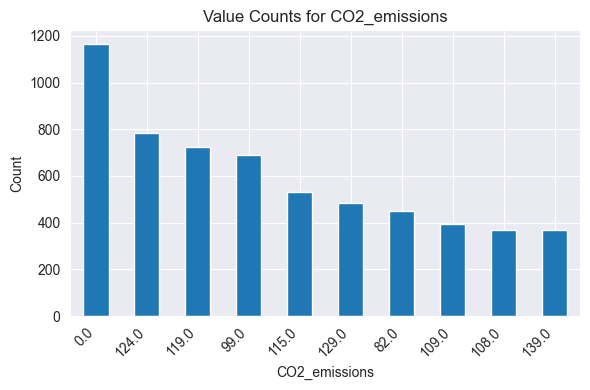


----------------------------------------

📌 Column: empty_weight
  • Unique count: 1144
  • Value counts:
empty_weight
1333.0    1838
1454.0    1689
1504.0    1541
1365.0     952
1169.0     765
1575.0     709
1423.0     230
1395.0     219
1165.0     201
1320.0     199
1280.0     178
1055.0     169
1615.0     145
1350.0     138
1335.0     132
1390.0     130
1370.0     129
1310.0     119
1345.0     117
1050.0     113
1472.0     111
1701.0     108
1090.0     106
905.0      102
1735.0     100
1430.0      98
1315.0      98
1680.0      95
1505.0      90
1275.0      86
1295.0      85
1040.0      85
1245.0      83
1355.0      82
1385.0      80
1164.0      80
1485.0      78
1255.0      78
1425.0      73
1135.0      72
1445.0      71
1065.0      71
1500.0      71
1305.0      71
1803.0      68
975.0       68
1076.0      67
1733.0      65
1555.0      65
1439.0      64
1415.0      64
1115.0      62
1180.0      61
1375.0      60
1465.0      60
1845.0      59
1260.0      59
1110.0      58
1393.0    

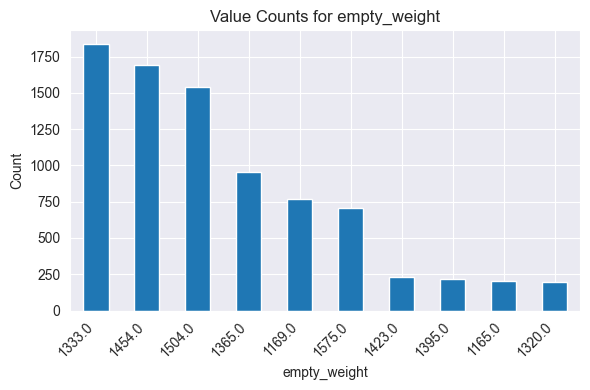


----------------------------------------

📌 Column: full_service_history
  • Unique count: 2
  • Value counts:
full_service_history
no     13704
yes    11038


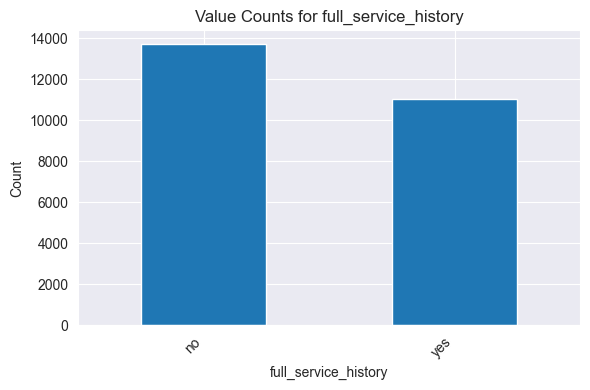


----------------------------------------

📌 Column: upholstery
  • Unique count: 6
  • Value counts:
upholstery
Cloth           13503
Full leather     6651
Part leather     3142
alcantara         732
Other             551
Velour            163


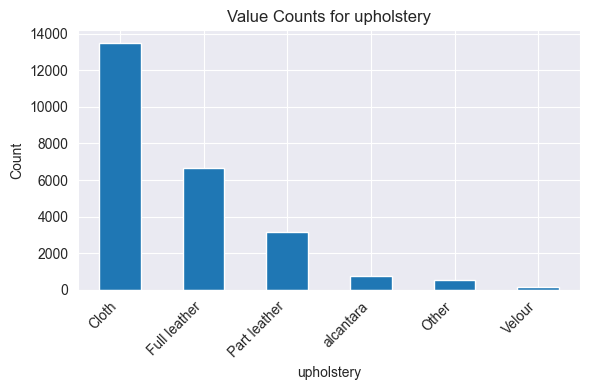


----------------------------------------

📌 Column: previous_owner
  • Unique count: 14
  • Value counts:
previous_owner
0     12561
1      8346
2      2971
3       589
4       147
5        53
6        32
7        15
9        13
8        10
10        2
12        1
14        1
13        1


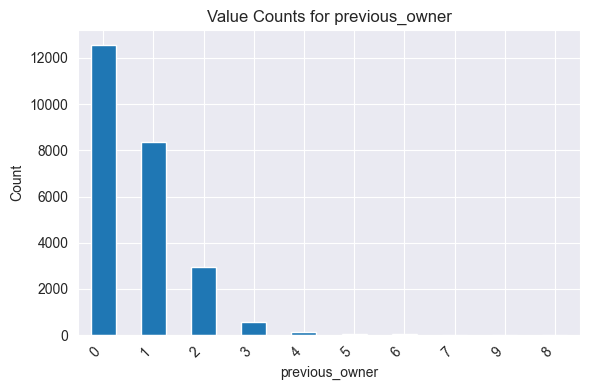


----------------------------------------

📌 Column: age
  • Unique count: 32
  • Value counts:
age
3.0     3534
4.0     3404
1.0     2413
5.0     2349
2.0     2349
6.0     1444
0.0     1432
7.0     1198
8.0      898
9.0      660
10.0     620
11.0     609
12.0     527
15.0     450
14.0     405
13.0     403
16.0     364
17.0     254
18.0     222
19.0     189
21.0     169
20.0     165
22.0     143
23.0     124
24.0      77
27.0      66
25.0      66
28.0      65
26.0      58
30.0      43
29.0      41
1.5        1


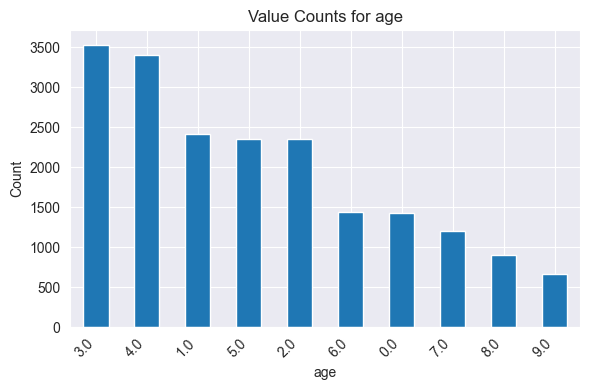


----------------------------------------

📌 Column: fuel_type
  • Unique count: 6
  • Value counts:
fuel_type
Petrol       14592
Diesel        8330
nan Value     1251
Gas            323
Others         198
Electric        48


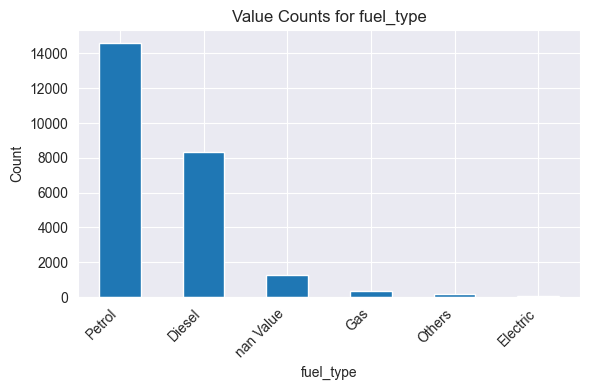


----------------------------------------

📌 Column: cons_avg
  • Unique count: 358
  • Value counts:
cons_avg
5.000000     704
5.100000     568
5.150000     512
5.350000     486
4.500000     468
4.850000     458
5.650000     436
5.500000     414
5.250000     414
6.150000     409
4.900000     360
5.050000     317
5.200000     305
6.000000     280
6.950000     279
5.450000     271
5.800000     267
4.350000     261
4.600000     255
5.850000     248
4.750000     246
6.250000     240
5.050000     234
4.650000     233
4.150000     232
3.900000     231
3.950000     231
4.550000     231
6.550000     224
7.000000     220
6.100000     218
3.450000     217
3.850000     215
4.950000     210
8.000000     207
4.700000     205
5.550000     200
4.400000     199
5.600000     197
6.400000     194
5.750000     194
5.950000     193
6.800000     189
4.300000     188
5.900000     186
5.700000     185
5.400000     180
6.600000     178
6.350000     172
4.250000     168
4.800000     166
7.500000     164
6.850

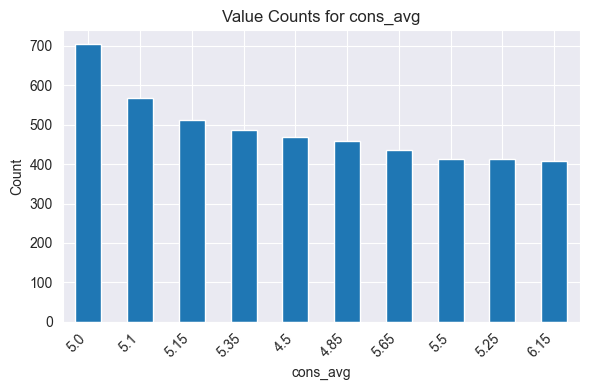


----------------------------------------

📌 Column: comfort_convenience_count_z
  • Unique count: 35
  • Value counts:
comfort_convenience_count_z
-1.441825    2298
-0.811841    1298
-0.685844    1245
-0.559847    1099
-1.063835    1090
-0.937838     989
 0.700121     986
 0.574124     959
-0.433851     945
 0.826117     937
 0.952114     930
 0.448127     929
 1.078111     925
-0.055860     883
 0.322130     877
-0.181857     867
 0.196133     824
 0.070137     816
 1.204108     794
-0.307854     751
 1.330105     720
 1.456101     667
-1.189831     631
 1.582098     596
-1.315828     435
 1.708095     395
 1.834092     316
 1.960089     184
 2.086085     139
 2.212082     106
 2.338079      55
 2.464076      28
 2.590073      13
 2.716069      12
 2.842066       3


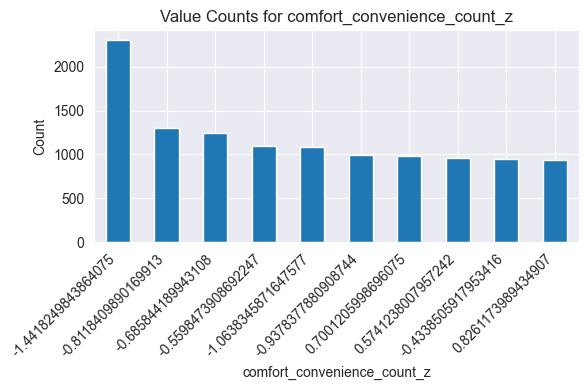


----------------------------------------

📌 Column: entertainment_media_count_z
  • Unique count: 17
  • Value counts:
entertainment_media_count_z
-1.285381    3923
-0.760975    2310
-0.498772    2241
-0.236569    2083
 0.550040    1892
 0.287837    1858
-1.023178    1806
 0.025634    1785
 0.812243    1740
 1.074446    1535
 1.336649    1315
 1.598852    1053
 1.861055     713
 2.123258     368
 2.385461      97
 2.647664      19
 2.909867       4


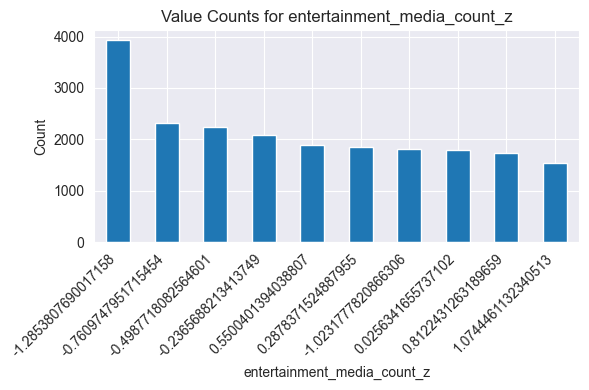


----------------------------------------

📌 Column: safety_security_count_z
  • Unique count: 37
  • Value counts:
safety_security_count_z
-1.591889    2293
-0.473651    1625
-0.597900    1278
-0.225154    1173
 0.023344    1139
-0.349402    1125
 0.147592    1104
-0.100905    1099
 0.271841    1079
-0.722148    1057
 0.396090     985
 0.644587     868
 0.520338     820
 1.141582     785
 0.768836     774
 1.265830     762
 1.017333     752
-0.846397     714
 1.390079     687
 0.893084     679
 1.514328     637
 1.638576     602
-1.467640     523
-1.094894     394
-0.970646     352
-1.219143     336
 1.762825     316
 1.887074     215
-1.343391     178
 2.011322     140
 2.135571     137
 2.259820      54
 2.384068      27
 2.632566      18
 2.508317      12
 2.756814       2
 2.881063       1


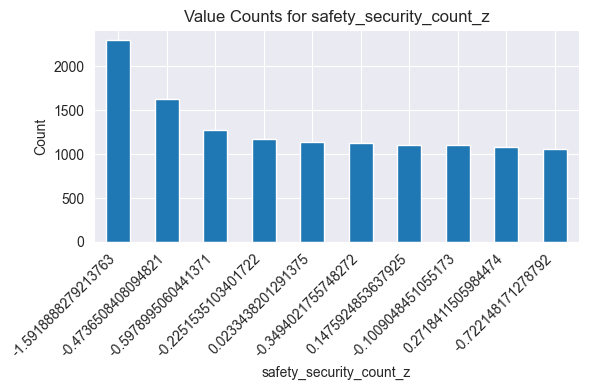


----------------------------------------

📌 Column: extras_count_z
  • Unique count: 22
  • Value counts:
extras_count_z
-0.784028    4411
-1.044769    4038
-0.523286    2613
-0.262545    2440
-0.001803    2001
 0.258938    1777
 0.519680    1411
 0.780421    1336
 1.041163    1000
 1.301904     876
 1.562646     796
 1.823387     573
 2.084129     502
 2.344870     343
 2.605612     249
 2.866353     179
 3.127095     102
 3.387836      53
 3.648578      27
 3.909319      10
 4.170061       3
 5.734510       2


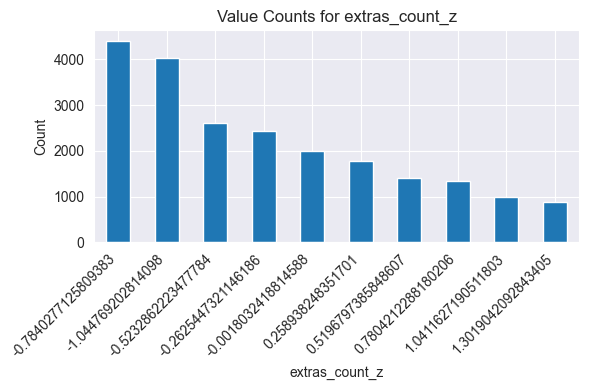


----------------------------------------



In [27]:
import matplotlib.pyplot as plt

# 1) Tüm sütun isimlerini al
all_columns = ri1.columns.tolist()

for col in all_columns:
    print(f"📌 Column: {col}")
    
    # 2) Liste tipindeki değerleri tuple’a çevir (varsa)
    ser = ri1[col].apply(lambda x: tuple(x) if isinstance(x, list) else x)
    
    # 3) Unique sayısı
    unique_count = ser.nunique(dropna=False)
    print(f"  • Unique count: {unique_count}")
    
    # 4) Değerlerin frekansları
    vc = ser.value_counts(dropna=False)
    print("  • Value counts:")
    print(vc.to_string())
    
    # 5) Frekans grafiği (ilk 10’a kırpma)
    top_vc = vc.head(10)
    plt.figure(figsize=(6, 4))
    top_vc.plot(kind='bar')
    plt.title(f"Value Counts for {col}")
    plt.ylabel("Count")
    plt.xlabel(col)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    print("\n" + "-"*40 + "\n")

In [28]:
# “location” sütunu “BG” veya “EE” olan satırları çıkar
ri1 = ri1[~ri1['location'].isin(['BG', 'EE'])].reset_index(drop=True)

In [29]:
ri1.reset_index(drop=True, inplace=True)







In [30]:
ri1.to_csv("outlier_dusulmus_veri.csv", index=False)





